In [1]:
#%pip install -U numpy matplotlib imageio tifffile pillow ipython scipy scikit-image ipython

In [ ]:
from __future__ import annotations
from dataclasses import dataclass
from pathlib import Path
from typing import Tuple
import numpy as np
import matplotlib.pyplot as plt
import imageio.v3 as iio
import tifffile as tiff
from PIL import Image
from IPython.display import display
from scipy.ndimage import gaussian_filter
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects, disk, opening, closing
from skimage.segmentation import clear_border
from typing import List, Tuple, Dict, Optional, Iterable
from skimage.measure import label, regionprops



In [66]:
def find_project_root(
    start: str | Path = ".",
    *,
    marker: str = "pictures",
    required_subpath: str = "pictures/pictures_in",
    max_up: int = 10,
) -> Path:
    """
    Find a root directory by walking upwards until `required_subpath` exists.
    """
    p = Path(start).resolve()
    for _ in range(max_up + 1):
        if (p / required_subpath).exists():
            return p
        if p.parent == p:
            break
        p = p.parent
    raise FileNotFoundError(
        f"Cannot find project root from {Path(start).resolve()} "
        f"(missing {required_subpath}). "
        f"Try setting root=Path('...') to your repo root."
    )
def _to_float01(img: np.ndarray) -> np.ndarray: # 将图片数据转换为0-1范围的浮点数
    img = np.asarray(img)
    if img.ndim == 2:
        img = np.stack([img, img, img], axis=-1)
    if img.ndim == 3 and img.shape[-1] == 4:
        img = img[..., :3]
    if img.ndim != 3 or img.shape[-1] != 3:
        raise ValueError(f"Expect RGB image, got {img.shape}")

    if np.issubdtype(img.dtype, np.floating): # 如果已经是浮点数类型，检查是否需要缩放
        x = img.astype(np.float32, copy=False)
        if np.nanmax(x) > 1.0:
            x = x / 255.0
    else:
        x = img.astype(np.float32) / 255.0
    return np.clip(x, 0.0, 1.0)




def slider_c(val: float) -> float:
    """val in [-100,100] -> c in [-1,1]"""
    return float(np.clip(val, -100, 100) / 100.0)

def slider_factor(val: float) -> float:
    """val in [-100,100] -> factor in [0,2]"""
    c = slider_c(val)
    return float(np.clip(1.0 + c, 0.0, 2.0))
def rgb_to_luma(img01: np.ndarray) -> np.ndarray:
    return (0.2126 * img01[..., 0] +
            0.7152 * img01[..., 1] +
            0.0722 * img01[..., 2])

def adjust_clarity_luma(img01: np.ndarray, clarity: float, sigma: float = 2.0) -> np.ndarray:
    c = slider_c(clarity)  # [-1,1]
    L = rgb_to_luma(img01)                      # (H,W)
    L_blur = gaussian_filter(L, sigma=sigma)    # (H,W)
    L2 = np.clip(L + c * (L - L_blur), 0.0, 1.0)
    eps = 1e-6
    ratio = (L2 + eps) / (L + eps)              # (H,W)
    out = img01 * ratio[..., None]
    return np.clip(out, 0.0, 1.0)

def adjust_brightness(img01: np.ndarray, brightness: float) -> np.ndarray:
    f = slider_factor(brightness)
    return np.clip(img01 * f, 0.0, 1.0)
def adjust_highlights(img01: np.ndarray, highlights: float) -> np.ndarray:
    f = slider_factor(highlights)
    out = img01 + (1.0 - img01) * (f - 1.0)
    return np.clip(out, 0.0, 1.0)

def adjust_contrast(img01: np.ndarray, contrast: float) -> np.ndarray:
    f = slider_factor(contrast)
    return np.clip((img01 - 0.5) * f + 0.5, 0.0, 1.0)

def adjust_saturation(img01: np.ndarray, saturation: float) -> np.ndarray:
    f = slider_factor(saturation)
    luma = (0.2126 * img01[..., 0] + 0.7152 * img01[..., 1] + 0.0722 * img01[..., 2])[..., None]
    out = luma + (img01 - luma) * f
    return np.clip(out, 0.0, 1.0)

def adjust_warmth(img01: np.ndarray, warmth: float) -> np.ndarray:
    c = slider_c(warmth)
    r_factor = float(np.clip(1.0 + c, 0.0, 2.0))
    b_factor = float(np.clip(1.0 - c, 0.0, 2.0))

    out = img01.copy()
    out[..., 0] = np.clip(out[..., 0] * r_factor, 0.0, 1.0)  # R
    out[..., 2] = np.clip(out[..., 2] * b_factor, 0.0, 1.0)  # B
    return out

def apply_sliders(img: np.ndarray, params) -> np.ndarray:
    x = _to_float01(img)
    x = adjust_clarity_luma(x, clarity=params.clarity, sigma=2.0)
    x = adjust_brightness(x, params.brightness)
    x = adjust_contrast(x, params.contrast)
    x = adjust_highlights(x, params.highlights)
    x = adjust_saturation(x, params.saturation)
    x = adjust_warmth(x, params.warmth)
    return x

def fill_black_holes(mask: np.ndarray, max_hole_area: int | None = None) -> np.ndarray:
    m = mask.astype(bool)
    filled_all = ndi.binary_fill_holes(m)

    if max_hole_area is None:
        return filled_all

    holes = filled_all & (~m)          # pixels that would be added to foreground
    if not holes.any():
        return m

    lab, n = ndi.label(holes)
    if n == 0:
        return m

    counts = np.bincount(lab.ravel())  # counts[0] is background
    small_ids = np.where(counts <= max_hole_area)[0]
    small_ids = small_ids[small_ids != 0]

    if small_ids.size == 0:
        return m

    small_holes = np.isin(lab, small_ids)
    return m | small_holes

def denoise_mask_conservative(mask_filled: np.ndarray,
                              min_obj_area: int = 12,
                              drop_border: bool = False) -> np.ndarray:
    m = mask_filled.astype(bool)
    
    if drop_border:
        m = clear_border(m)
    m = remove_small_objects(m, min_size=min_obj_area, connectivity=2)
    
    return m.astype(bool)

def remove_large_objects(mask: np.ndarray, max_area: int) -> np.ndarray:
    lab = label(mask)
    out = np.zeros_like(mask, dtype=bool)
    for r in regionprops(lab):
        if r.area <= max_area:
            out[lab == r.label] = True
    return out

In [ ]:
# Cell 1 — 定义“一键批处理”函数（ipynb 用）

IMG_EXTS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff", ".webp"}


@dataclass(frozen=True)
class BatchParams:
    # sliders
    clarity: float = 0
    brightness: float = 0
    highlights: float = 0
    contrast: float = 0
    saturation: float = 0
    warmth: float = 0

    # threshold
    T: float = 0.5
    dark_is_fg: bool = True  # True: gray < T; False: gray > T

    # mask cleanup
    max_hole_area: int = 100
    min_obj_area: float = 0.04
    drop_border: bool = True


def _iter_images(folder: Path, recursive: bool = False) -> Iterable[Path]:
    it = folder.rglob("*") if recursive else folder.iterdir()
    for p in it:
        if p.is_file() and p.suffix.lower() in IMG_EXTS:
            yield p

def process_one_for_check(
    img_path: str | Path,
    *,
    params: BatchParams,
    save: bool = True, 
    ):

    img_path = Path(img_path)
    img = np.asarray(Image.open(img_path))

    # 1) sliders first (returns float01 RGB)
    out_change_threshold = apply_sliders(
        img,
        clarity=params.clarity,
        brightness=params.brightness,
        highlights=params.highlights,
        contrast=params.contrast,
        saturation=params.saturation,
        warmth=params.warmth,
    )
    img_changed = out_change_threshold
    R = np.zeros_like(img_changed)
    G = np.zeros_like(img_changed)
    B = np.zeros_like(img_changed)

    R[..., 0] = img[..., 0]
    G[..., 1] = img[..., 1]
    B[..., 2] = img[..., 2]
    
    Y = 0.2126 * R + 0.7152 * G + 0.0722 * B
    # 2) RGB -> gray -> threshold (bool mask)
    gray = (
        0.2126 * out_change_threshold[..., 0]
        + 0.7152 * out_change_threshold[..., 1]
        + 0.0722 * out_change_threshold[..., 2]
    )
    mask = gray < params.T if params.dark_is_fg else gray > params.T

    # 3) fill holes + denoise (bool->bool)
    mask = fill_black_holes(mask, max_hole_area=params.max_hole_area)
    mask = denoise_mask_conservative(
        mask,
        min_obj_area=params.min_obj_area,
        drop_border=params.drop_border,
    )

    # 4) bw visualization (uint8)
    bw = (~mask).astype(np.uint8) * 255

    stats = {
        "img": str(img_path),
        "shape": tuple(mask.shape),
        "mask_true": int(mask.sum()),
    }
    return gray, bw, mask, stats, img,R,G,B,Y

def process_folder(
    in_dir: str | Path,
    out_bw_dir: str | Path,
    *,
    params: BatchParams = BatchParams(),
    recursive: bool = False,
) -> None:

    in_dir = Path(in_dir)
    out_bw_dir = Path(out_bw_dir)
    out_bw_dir.mkdir(parents=True, exist_ok=True)

    imgs = list(_iter_images(in_dir, recursive=recursive))
    if not imgs:
        print(f"No images found in: {in_dir}")
        return

    for p in imgs:
        try:
            img = np.asarray(Image.open(p))

            # 1) sliders (returns float01 RGB)
            out_change_threshold = apply_sliders(
                img,
                clarity=params.clarity,
                brightness=params.brightness,
                highlights=params.highlights,
                contrast=params.contrast,
                saturation=params.saturation,
                warmth=params.warmth,
            )


            # 2) gray + threshold
            gray = (
                0.2126 * out_change_threshold[..., 0]
                + 0.7152 * out_change_threshold[..., 1]
                + 0.0722 * out_change_threshold[..., 2]
            )
            mask = gray > params.T if params.dark_is_fg else gray < params.T  # bool

            # 3) fill holes + denoise (bool in/bool out)
            mask = fill_black_holes(mask, max_hole_area=params.max_hole_area)
            mask = denoise_mask_conservative(
                mask,
                min_obj_area=params.min_obj_area,
                drop_border=params.drop_border,
            )
            # 5) export bw 
            bw = (~mask).astype(np.uint8) * 255  # white bg, black fg
            Image.fromarray(bw, mode="L").save(out_bw_dir / f"{p.stem}_bcst.test1.png")

        except Exception as e:
            print(f"[FAIL] {p.name}: {e}")



In [68]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops

def to_float01(img: np.ndarray) -> np.ndarray:
    x = img.astype(np.float64)
    if np.issubdtype(img.dtype, np.integer):
        x /= 255.0
    else:
        if x.max() > 1.0:
            x /= 255.0
    return np.clip(x, 0.0, 1.0)

def to_gray_luminance(img: np.ndarray) -> np.ndarray:
    x = to_float01(img)
    if x.ndim == 2:
        return x
    R = x[..., 0]
    G = x[..., 1]
    B = x[..., 2]
    return 0.2126 * R + 0.7152 * G + 0.0722 * B

def band_stats(gray: np.ndarray, n_bins: int = 64, connectivity: int = 2):
    edges = np.linspace(0.0, 1.0, n_bins + 1)
    centers = (edges[:-1] + edges[1:]) / 2

    pixel_counts = []
    max_cc_areas = []
    num_ccs = []

    for i in range(n_bins):
        lo, hi = edges[i], edges[i + 1]
        band = (gray >= lo) & (gray < hi)

        pixel_counts.append(int(band.sum()))

        lab = label(band, connectivity=connectivity)
        props = regionprops(lab)
        areas = [r.area for r in props]

        max_cc_areas.append(max(areas) if areas else 0)
        num_ccs.append(len(areas))

    return centers, edges, np.array(pixel_counts), np.array(max_cc_areas), np.array(num_ccs)

def plot_band_stats(gray: np.ndarray, n_bins: int = 64):
    centers, edges, pixel_counts, max_cc_areas, num_ccs = band_stats(gray, n_bins=n_bins)

    fig, axes = plt.subplots(3, 1, figsize=(9, 10), sharex=True)

    axes[0].plot(centers, pixel_counts, linewidth=2)
    axes[0].set_ylabel("pixel count")
    axes[0].set_title("Pixels per gray band")

    axes[1].plot(centers, max_cc_areas, linewidth=2)
    axes[1].set_ylabel("max CC area")
    axes[1].set_title("Largest connected component per gray band")

    axes[2].plot(centers, num_ccs, linewidth=2)
    axes[2].set_ylabel("num CCs")
    axes[2].set_xlabel("gray band center (0=dark, 1=bright)")
    axes[2].set_title("Number of connected components per gray band")

    for ax in axes:
        ax.grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

    return centers, edges, pixel_counts, max_cc_areas, num_ccs

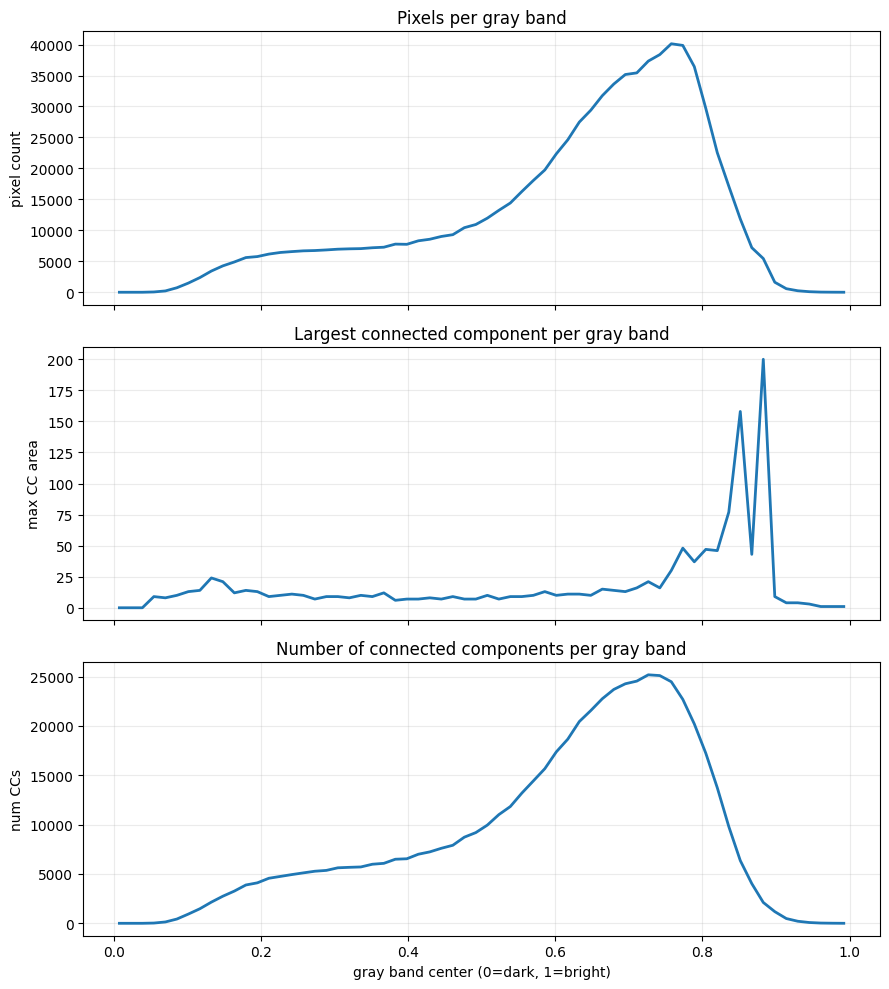

In [69]:
root = find_project_root(".")  
img = np.asarray(Image.open(root / "pictures" / "pictures_in" / "235761_1.tif"))
gray = to_gray_luminance(img)
centers, edges, pixel_counts, max_cc_areas, num_ccs = plot_band_stats(gray, n_bins=64)

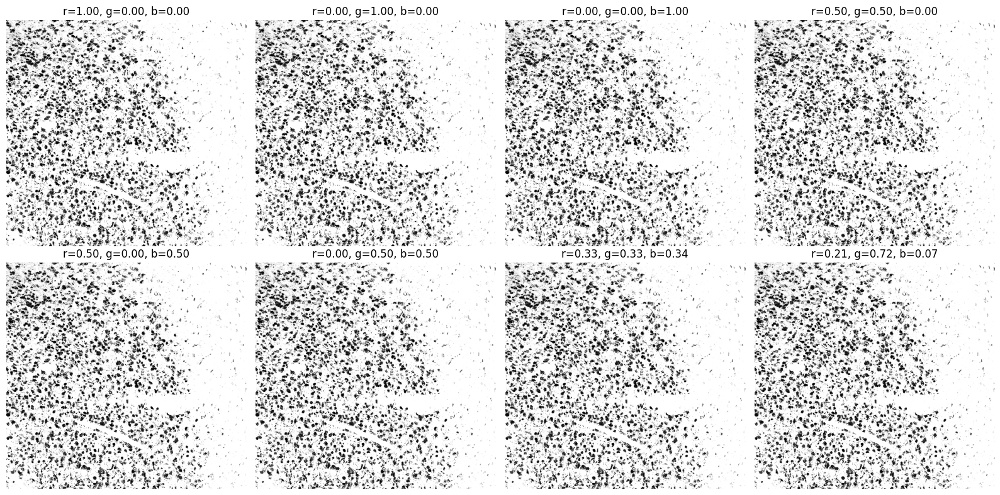

In [72]:
root = find_project_root(".")  
list_img_name = ("235761_1.tif")   #what do you want to check? 
params_0 = BatchParams(
    clarity=0,
    brightness=0,
    highlights=0,
    contrast=0,
    saturation=0,
    warmth=0,
    T=0.5,
    dark_is_fg=True,
    max_hole_area=100,
    min_obj_area=0.2,
    drop_border=False
)
params_1 = BatchParams(
    clarity=30,
    brightness=70,
    highlights=-100,
    contrast=99,
    saturation=-99,
    warmth=0,
    T=0.5,
    dark_is_fg=True,
    max_hole_area=100,
    min_obj_area=0.2,
    drop_border=False
)
img = np.asarray(Image.open(root / "pictures" / "pictures_in" / "235761_1.tif"))
H, W = img.shape[:2]
total_pixels = H * W

out_change_threshold = apply_sliders(img,params_1)
img = out_change_threshold.astype(np.float64)
R, G, B = img[..., 0], img[..., 1], img[..., 2]

weights_list = [
    (1.0, 0.0, 0.0),
    (0.0, 1.0, 0.0),
    (0.0, 0.0, 1.0),
    (0.5, 0.5, 0.0),
    (0.5, 0.0, 0.5),
    (0.0, 0.5, 0.5),
    (0.33, 0.33, 0.34),
    (0.2126, 0.7152, 0.0722),
]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for ax, (r, g, b) in zip(axes.ravel(), weights_list):
    gray = r * R + g * G + b * B
    ax.imshow(gray, cmap="gray", vmin=gray.min(), vmax=gray.max())
    ax.set_title(f"r={r:.2f}, g={g:.2f}, b={b:.2f}")
    ax.axis("off")

plt.tight_layout()
plt.show()


C:\Users\qq187\AppData\Local\Temp\ipykernel_18008\1245197883.py:136: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  m = remove_small_objects(m, min_size=min_obj_area, connectivity=2)


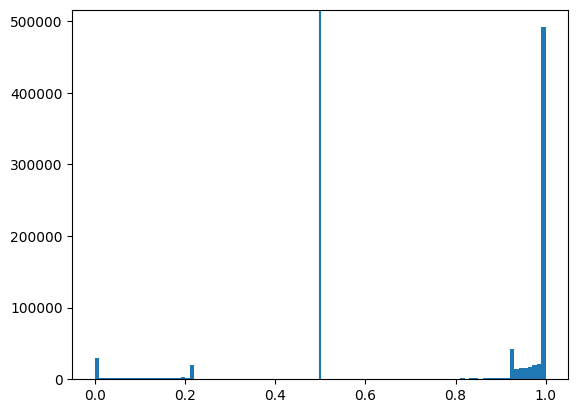

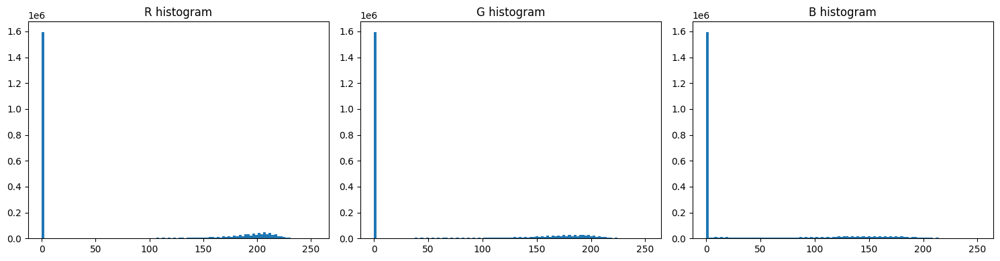

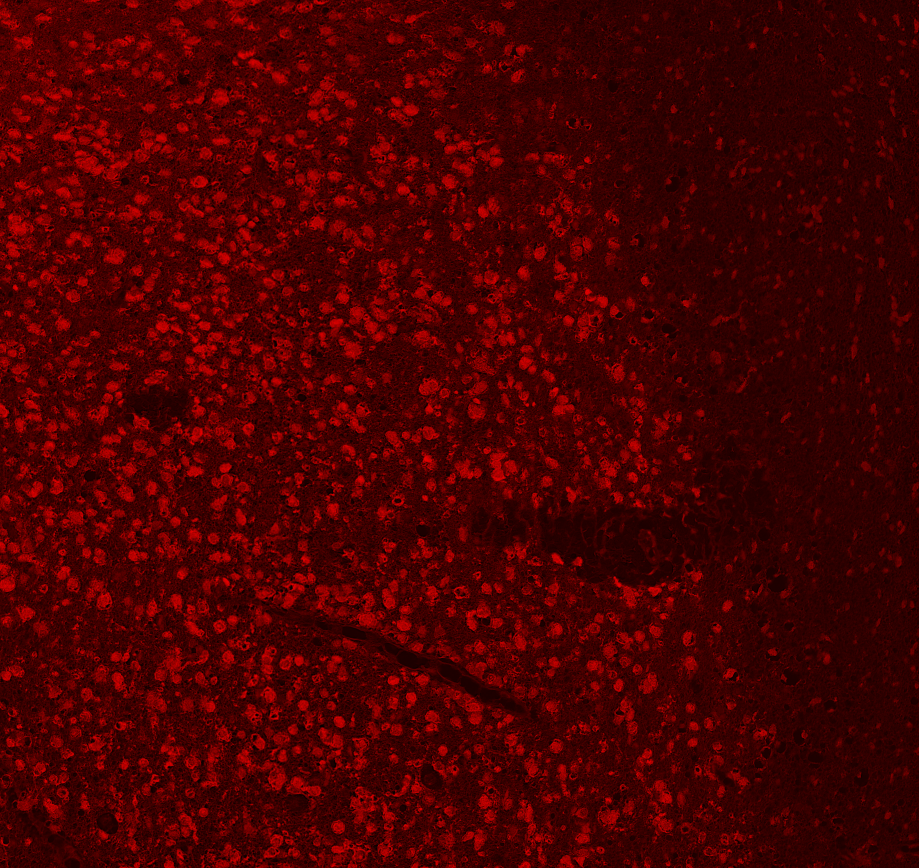

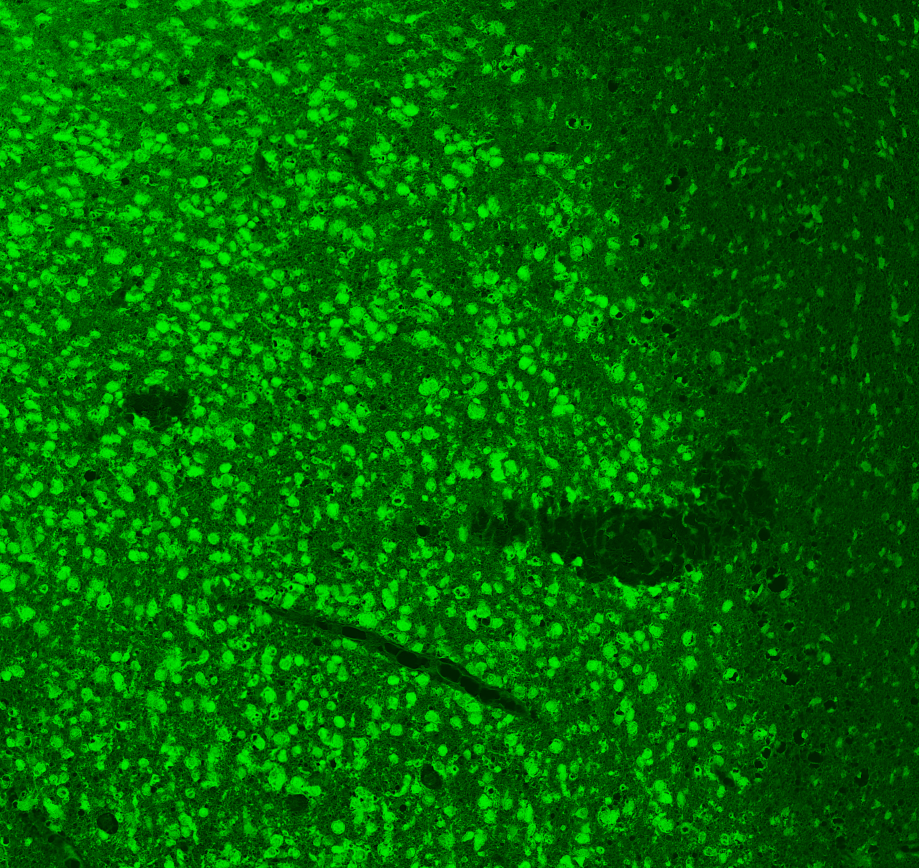

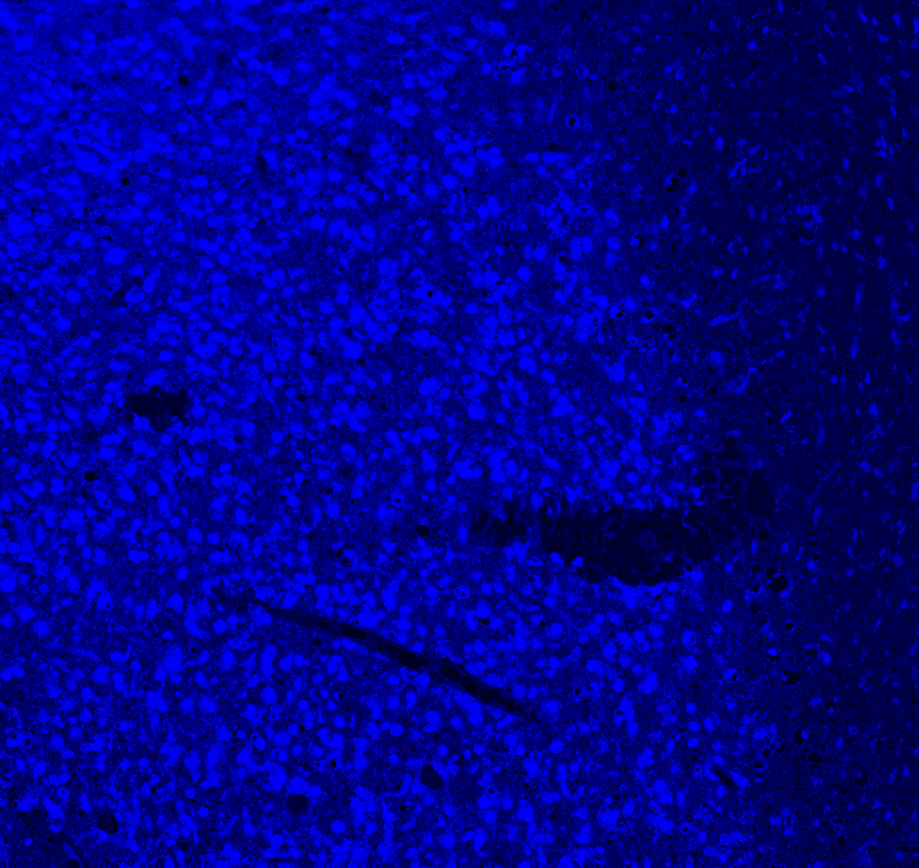

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..252.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..252.0].


<Figure size 640x480 with 0 Axes>

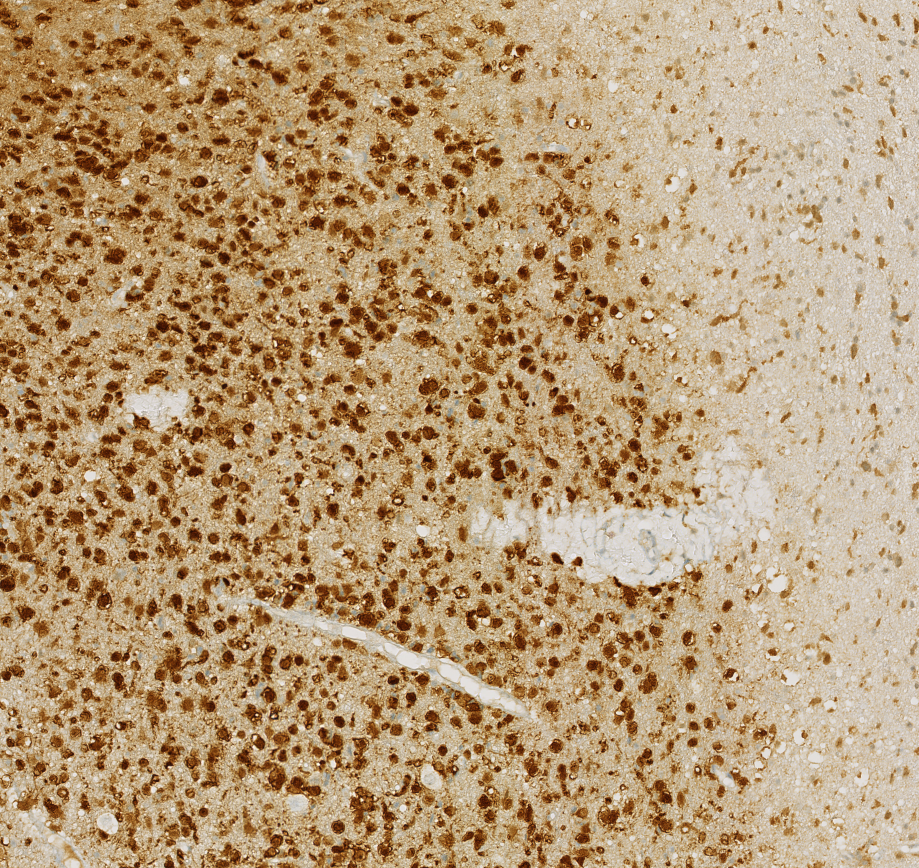

{'img': 'C:\\project\\cancer1.0\\pictures\\pictures_in\\235761_1.tif',
 'shape': (868, 919),
 'mask_true': 121173}

In [58]:
#test and virtual display and adjest parameters here:

root = find_project_root(".")  
list_img_name = ("235761_1.tif")   #what do you want to check? 
params = BatchParams(
    clarity=30,
    brightness=70,
    highlights=-100,
    contrast=99,
    saturation=-99,
    warmth=0,
    T=0.5,
    dark_is_fg=True,
    max_hole_area=100,
    min_obj_area=0.2,
    drop_border=False
)
#for img_name in list_img_name:
#    bw, points, centroids, stats, img= process_one_for_check(
#        root / "pictures" / "pictures_in" / img_name,
#        params=params,
#        save=True,
#    )
gray, bw, mask, stats, img,R,G,B,Y= process_one_for_check(
    root / "pictures" / "pictures_in" / "235761_1.tif",
        params=params,
        save=True,
    )
plt.hist(gray.ravel(), bins=100)
plt.axvline(params.T)
plt.show()
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(R.ravel(), bins=100)
axes[0].set_title("R histogram")

axes[1].hist(G.ravel(), bins=100)
axes[1].set_title("G histogram")

axes[2].hist(B.ravel(), bins=100)
axes[2].set_title("B histogram")

plt.tight_layout()
plt.show()
display(Image.fromarray((R * 255).astype(np.uint8) if R.dtype != np.uint8 else R))
display(Image.fromarray((G * 255).astype(np.uint8) if G.dtype != np.uint8 else G))
display(Image.fromarray((B * 255).astype(np.uint8) if B.dtype != np.uint8 else B))
for ax, ch, name in zip(axes, [R, G, B], ["R", "G", "B"]):
    ax.imshow(ch, cmap="gray", vmin=0, vmax=255)   # 如果你的数据是 0~1
    ax.set_title(name)
    ax.axis("off")

plt.tight_layout()
plt.show()
display(Image.fromarray(img, mode="RGB"))

#display(Image.fromarray(bw, mode="L"))
    
stats

In [ ]:


#auto run all images in the folder with the same parameters:
root = find_project_root(".") # 你项目根目录（ipynb所在目录通常就是）

params = BatchParams(
    clarity=30,
    brightness=70,
    highlights=-100,
    contrast=99,
    saturation=-99,
    warmth=0,
    T=0.5,
    dark_is_fg=True,
    max_hole_area=100,
    min_obj_area=0.2,
    drop_border=False,
    min_area=20,
    point_radius=6,
)

process_folder(
    root / "pictures" / "pictures_in",
    root / "pictures" / "pic_blacknwhite",
    root / "pictures" / "pic_centroids",
    root / "pictures" / "centroids_csv",
    params=params,
    recursive=False,
)


C:\Users\qq187\AppData\Local\Temp\ipykernel_33428\2120466128.py:136: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  m = remove_small_objects(m, min_size=min_obj_area, connectivity=2)


[FAIL] 296328_1.tif: name 'csv' is not defined
[FAIL] 296335_1.tif: name 'csv' is not defined
[FAIL] 353793_1.tif: name 'csv' is not defined


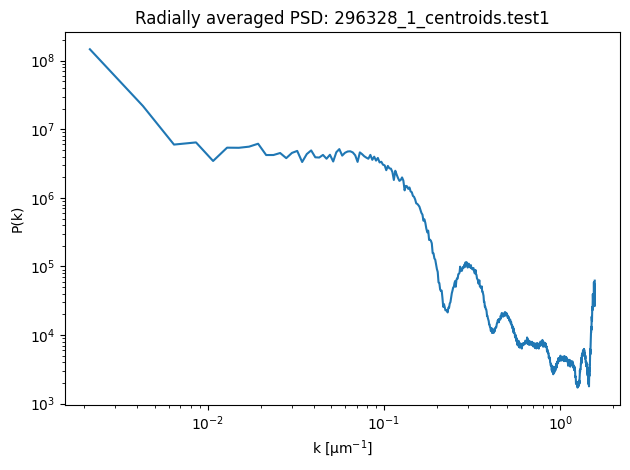

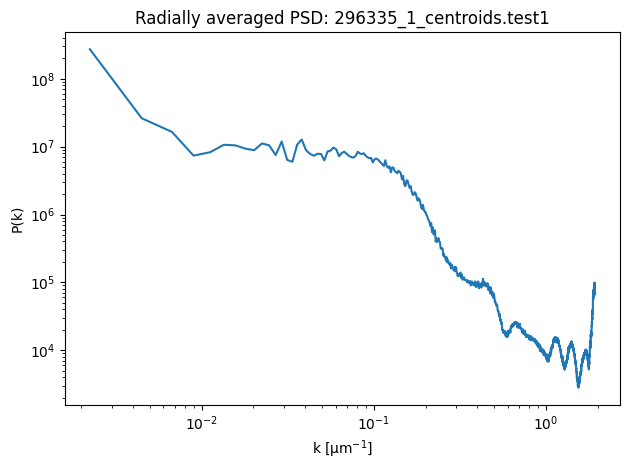

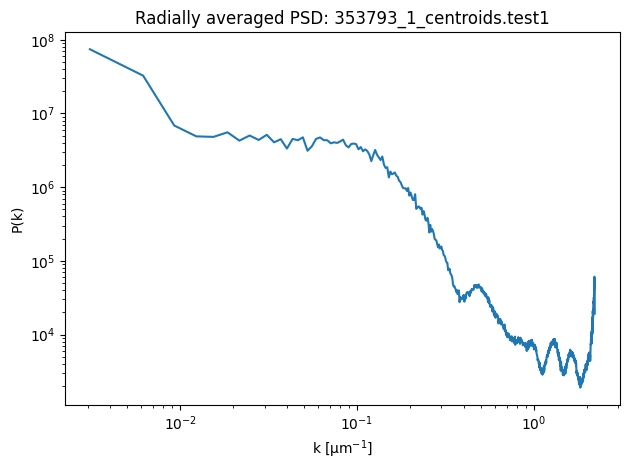

In [ ]:
def psd2d_image(path: str | Path, *, invert_black_points: bool = True) -> np.ndarray:
    """
    Return 2D PSD (float32) computed from centroid point image.
    Assumes centroid image: white bg, black points.
    """
    a = np.asarray(Image.open(path).convert("L"), dtype=np.uint8)
    I = (a < 128).astype(np.float32) if invert_black_points else (a > 128).astype(np.float32)

    f = I - float(I.mean())
    F = np.fft.fft2(f)
    psd = np.abs(F) ** 2
    psd = np.fft.fftshift(psd).astype(np.float32)
    return psd


def radial_psd(psd2d: np.ndarray, pixel_size: float = 1.0):
    """
    Radial average of a 2D PSD (already fftshifted).
    Returns:
      k (µm^-1 if pixel_size in µm/px), Pk
    """
    psd2d = np.asarray(psd2d, dtype=np.float64)
    h, w = psd2d.shape
    cy, cx = h // 2, w // 2

    y, x = np.indices((h, w))
    r = np.sqrt((y - cy) ** 2 + (x - cx) ** 2).astype(np.int32)

    # radial mean
    tbin = np.bincount(r.ravel(), weights=psd2d.ravel())
    nr = np.bincount(r.ravel())
    Pk = tbin / np.maximum(nr, 1)

    # k axis matched to radial bins
    n = float(min(h, w))
    r_bins = np.arange(Pk.size, dtype=np.float64)
    k = r_bins / (n * float(pixel_size))

    return k, Pk

root = find_project_root(".")
in_dir = root / "pictures" / "pic_bw"
out_dir = root / "pictures" / "pic_psd"
out_dir.mkdir(parents=True, exist_ok=True)

pixel_size = 0.5 

for p in sorted(in_dir.glob("*.png")):
    psd2d = psd2d_image(p)
    k, Pk = radial_psd(psd2d, pixel_size=pixel_size)

    # 1) 保存 CSV（k, Pk）
    csv_path = out_dir / "pic_psd_csv" / f"{p.stem}_psd.csv"
    data = np.column_stack([k, Pk])
    np.savetxt(csv_path, data, delimiter=",", header="k_um^-1,Pk", comments="")

    # 2) 保存曲线图 PNG
    fig_path = out_dir / f"{p.stem}_psd.png"
    plt.figure()
    plt.loglog(k[1:], Pk[1:])  # skip k=0
    plt.xlabel("k [µm$^{-1}$]")
    plt.ylabel("P(k)")
    plt.title(f"Radially averaged PSD: {p.stem}")
    plt.tight_layout()
    plt.savefig(fig_path, dpi=200)
    plt.show()
    plt.close()
